In [1]:
import pandas as pd

# 1 - mzML parser ON
#### input mzml/AMP_ON
#### output mzml_parsed/ON

In [52]:
# Submit the SLURM job for mzml_parser_1.sh
!sbatch core/backend/mzml_parser_1_AMP.sh


Submitted batch job 20110894


In [10]:
# sum = pd.read_parquet('Projects/STD/mzml_parsed/ON/sum/df_transition_summed_1_test.parquet')
# sum

In [53]:
import pandas as pd
df = pd.read_parquet('Projects/AMP/mzml_parsed/ON/df_mzml_parser_1_AMP.parquet')
# Print number of unique Sample_ID
print(len(df['Sample_ID'].unique()))
df

42


,Lipid,Parent_Ion,Product_Ion,Retention_Time,OzESI_Intensity,Sample_ID,Transition
0,None,227.1,183.0,0.011583,40.640003,11162023_Blank-AMP_2x_MRMs_O3on_01,227.1 -> 183.0
1,None,227.1,183.0,0.024483,40.680004,11162023_Blank-AMP_2x_MRMs_O3on_01,227.1 -> 183.0
2,None,227.1,183.0,0.037383,40.640003,11162023_Blank-AMP_2x_MRMs_O3on_01,227.1 -> 183.0
3,None,227.1,183.0,0.050317,40.640003,11162023_Blank-AMP_2x_MRMs_O3on_01,227.1 -> 183.0
4,None,227.1,183.0,0.063233,40.640003,11162023_Blank-AMP_2x_MRMs_O3on_01,227.1 -> 183.0
...,...,...,...,...,...,...,...
5121228,None,533.5,183.0,29.949033,41.620003,11192023_5xFAD-m2-hippo-FAD257_AMP_2x_0.05uMd2...,533.5 -> 183.0
5121229,None,533.5,183.0,29.961967,41.600002,11192023_5xFAD-m2-hippo-FAD257_AMP_2x_0.05uMd2...,533.5 -> 183.0
5121230,None,533.5,183.0,29.974883,41.540005,11192023_5xFAD-m2-hippo-FAD257_AMP_2x_0.05uMd2...,533.5 -> 183.0
5121231,None,533.5,183.0,29.987800,41.480003,11192023_5xFAD-m2-hippo-FAD257_AMP_2x_0.05uMd2...,533.5 -> 183.0


In [8]:
unique_values = df['Sample_ID'].unique()
print(unique_values)


['11162023_Blank-AMP_2x_MRMs_O3on_01'
 '11162023_WT-m1-cereb-FAD245_AMP_2x_0.05uMd216-0_MRMs_O3on_01'
 '11162023_WT-m1-cortex-FAD245_AMP_2x_0.05uMd216-0_MRMs_O3on_01'
 '11162023_WT-m1-dienc-FAD245_AMP_2x_0.05uMd216-0_MRMs_O3on_01'
 '11162023_WT-m1-hippo-FAD245_AMP_2x_0.05uMd216-0_MRMs_O3on_01'
 '11162023_WT-m2-cereb-FAD246_AMP_2x_0.05uMd216-0_MRMs_O3on_01'
 '11162023_WT-m2-cortex-FAD249_AMP_2x_0.05uMd216-0_MRMs_O3on_01'
 '11162023_WT-m2-dienc-FAD249_AMP_2x_0.05uMd216-0_MRMs_O3on_01'
 '11162023_WT-m2-hippo-FAD249_AMP_2x_0.05uMd216-0_MRMs_O3on_01'
 '11162023_WT-m3-cereb-FAD263_AMP_2x_0.05uMd216-0_MRMs_O3on_01'
 '11162023_WT-m3-cortex-FAD263_AMP_2x_0.05uMd216-0_MRMs_O3on_01'
 '11162023_WT-m3-dienc-FAD263_AMP_2x_0.05uMd216-0_MRMs_O3on_01'
 '11162023_WT-m3-hippo-FAD263_AMP_2x_0.05uMd216-0_MRMs_O3on_01'
 '11162023_WT-m4-cereb-FAD263_AMP_2x_0.05uMd216-0_MRMs_O3on_01'
 '11162023_WT-m4-cortex-FAD263_AMP_2x_0.05uMd216-0_MRMs_O3on_01'
 '11162023_WT-m4-cortex-FAD263_AMP_2x_0.05uMd216-0_MRMs_O3on_0

In [9]:
# Ensure the Parent_Ion column is numeric
df['Parent_Ion'] = pd.to_numeric(df['Parent_Ion'], errors='coerce')

# Set tolerance for Parent_Ion comparison
tolerance = 0.2

# Filter based on Parent_Ion and Retention_Time window
df_filtered = df[(df['Parent_Ion'] >= 423.4 - tolerance) & 
                 (df['Parent_Ion'] <= 423.4 + tolerance) &
                 (df['Retention_Time'] >= 5) &
                 (df['Retention_Time'] <= 15)]

# Sort the filtered DataFrame by Retention_Time
df_filtered_sorted = df_filtered.sort_values(by='Retention_Time', ascending=True)

# Display the sorted DataFrame
df_filtered_sorted


,Lipid,Parent_Ion,Product_Ion,Retention_Time,OzESI_Intensity,Sample_ID,Transition
3798668,None,423.3,183.0,5.005800,49.420002,11192023_5xFAD-m1-dienc-FAD249_AMP_2x_0.05uMd2...,423.3 -> 183.0
62476,None,423.3,183.0,5.005817,41.060001,11162023_Blank-AMP_2x_MRMs_O3on_01,423.3 -> 183.0
3311893,None,423.3,183.0,5.005817,157.060013,11192023_5xFAD-m1-cereb-FAD249_AMP_2x_0.05uMd2...,423.3 -> 183.0
3070191,None,423.3,183.0,5.005817,80.680008,11162023_WT-m5-hippo-FAD263_AMP_2x_0.05uMd216-...,423.3 -> 183.0
3926379,None,423.3,183.0,5.005817,96.240005,11192023_5xFAD-m1-hippo-FAD231_AMP_2x_0.05uMd2...,423.3 -> 183.0
...,...,...,...,...,...,...,...
4678887,None,423.3,183.0,14.993267,430.640045,11192023_5xFAD-m2-dienc-FAD231_AMP_2x_0.05uMd2...,423.3 -> 183.0
1400435,None,423.3,183.0,14.993267,508.760040,11162023_WT-m3-dienc-FAD263_AMP_2x_0.05uMd216-...,423.3 -> 183.0
5062020,None,423.3,183.0,14.993267,90.440010,11192023_5xFAD-m2-hippo-FAD257_AMP_2x_0.05uMd2...,423.3 -> 183.0
1655857,None,423.3,183.0,14.993283,567.240051,11162023_WT-m4-cereb-FAD263_AMP_2x_0.05uMd216-...,423.3 -> 183.0


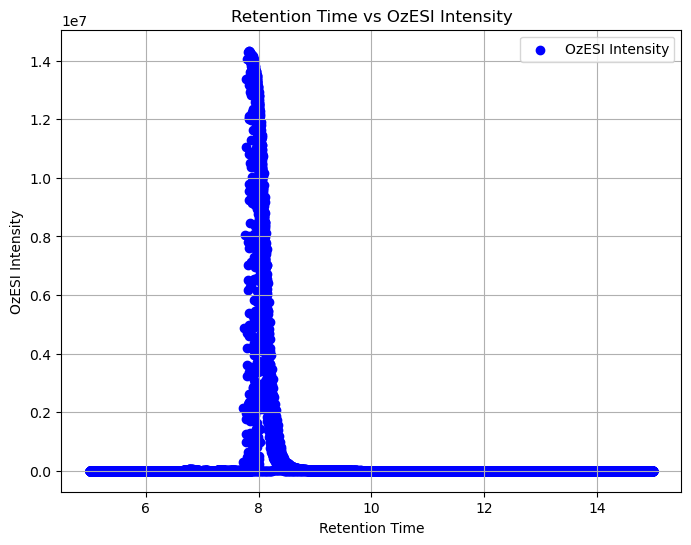

In [10]:
import matplotlib.pyplot as plt

# Plot the filtered data
plt.figure(figsize=(8, 6))
plt.scatter(df_filtered_sorted['Retention_Time'], df_filtered_sorted['OzESI_Intensity'], color='blue', label='OzESI Intensity')

# Add labels and title
plt.xlabel('Retention Time')
plt.ylabel('OzESI Intensity')
plt.title('Retention Time vs OzESI Intensity')
plt.legend()

# Show the plot
plt.grid(True)
plt.show()


# 2 - Sample

In [58]:
input_dir = 'Projects/AMP/mzml_parsed/ON/'
import glob; num_files = len(glob.glob('Projects/AMP/samples/ON/*.parquet'))
num_files   


41

In [59]:
# Submit the SLURM job for !sbatch core/backend/sample_2.sh
!sbatch core/backend/sample_2_AMP.sh


Submitted batch job 20111155


In [3]:
import pandas as pd
df = pd.read_parquet('Projects/AMP/samples/ON/h')
df

,Lipid,Parent_Ion,Product_Ion,Retention_Time,OzESI_Intensity,Sample_ID,Transition,Sample,STD,STD_RT_ON
0,None,227.1,183.0,0.011583,40.760002,11162023_WT-m2-cereb-FAD246_AMP_2x_0.05uMd216-...,227.1 -> 183.0,cereb_WT_m2_FAD246,None,7.990217
1,None,227.1,183.0,0.024483,40.720001,11162023_WT-m2-cereb-FAD246_AMP_2x_0.05uMd216-...,227.1 -> 183.0,cereb_WT_m2_FAD246,None,7.990217
2,None,227.1,183.0,0.037383,40.780003,11162023_WT-m2-cereb-FAD246_AMP_2x_0.05uMd216-...,227.1 -> 183.0,cereb_WT_m2_FAD246,None,7.990217
3,None,227.1,183.0,0.050317,40.760002,11162023_WT-m2-cereb-FAD246_AMP_2x_0.05uMd216-...,227.1 -> 183.0,cereb_WT_m2_FAD246,None,7.990217
4,None,227.1,183.0,0.063233,40.760002,11162023_WT-m2-cereb-FAD246_AMP_2x_0.05uMd216-...,227.1 -> 183.0,cereb_WT_m2_FAD246,None,7.990217
...,...,...,...,...,...,...,...,...,...,...
127706,None,533.5,183.0,29.949033,40.800003,11162023_WT-m2-cereb-FAD246_AMP_2x_0.05uMd216-...,533.5 -> 183.0,cereb_WT_m2_FAD246,None,7.990217
127707,None,533.5,183.0,29.961950,40.820004,11162023_WT-m2-cereb-FAD246_AMP_2x_0.05uMd216-...,533.5 -> 183.0,cereb_WT_m2_FAD246,None,7.990217
127708,None,533.5,183.0,29.974867,40.980003,11162023_WT-m2-cereb-FAD246_AMP_2x_0.05uMd216-...,533.5 -> 183.0,cereb_WT_m2_FAD246,None,7.990217
127709,None,533.5,183.0,29.987783,40.720001,11162023_WT-m2-cereb-FAD246_AMP_2x_0.05uMd216-...,533.5 -> 183.0,cereb_WT_m2_FAD246,None,7.990217


# 3 - Match
#### input sample/ON
#### output match/ON

In [65]:
input_dir = 'Projects/AMP/samples/ON/'
import glob; num_files = len(glob.glob(f'{input_dir}/*.parquet'))
num_files


41

In [5]:
# Submit the SLURM job for !sbatch core/backend/match_3.sh
!sbatch core/backend/match_3_AMP.sh


Submitted batch job 19985267


In [64]:
import pandas as pd
df = pd.read_parquet('Projects/AMP/match/ON/df_match_3_cortex_5xFAD_m2_FAD257.parquet')
#print unqiue vlaues of Lipid in df

df

,Lipid,Parent_Ion,Product_Ion,Retention_Time,OzESI_Intensity,Sample_ID,Transition,Sample,STD,STD_RT_ON,STD_RT_Dif,Species,Adjusted_RT,Class,STD_RT_OFF
0,,227.1,183.0,2.957400,42.0,11192023_5xFAD-m2-cortex-FAD257_AMP_2x_0.05uMd...,227.1 -> 183.0,cortex_5xFAD_m2_FAD257,None,8.029,-0.012933,10:1,3.446333,,8.016067
1,,227.1,183.0,2.970317,42.0,11192023_5xFAD-m2-cortex-FAD257_AMP_2x_0.05uMd...,227.1 -> 183.0,cortex_5xFAD_m2_FAD257,None,8.029,-0.012933,10:1,3.446333,,8.016067
2,,227.1,183.0,2.983250,42.0,11192023_5xFAD-m2-cortex-FAD257_AMP_2x_0.05uMd...,227.1 -> 183.0,cortex_5xFAD_m2_FAD257,None,8.029,-0.012933,10:1,3.446333,,8.016067
3,,227.1,183.0,2.996167,42.0,11192023_5xFAD-m2-cortex-FAD257_AMP_2x_0.05uMd...,227.1 -> 183.0,cortex_5xFAD_m2_FAD257,None,8.029,-0.012933,10:1,3.446333,,8.016067
4,,227.1,183.0,3.009083,42.0,11192023_5xFAD-m2-cortex-FAD257_AMP_2x_0.05uMd...,227.1 -> 183.0,cortex_5xFAD_m2_FAD257,None,8.029,-0.012933,10:1,3.446333,,8.016067
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
161720,,533.5,183.0,4.237533,42.0,11192023_5xFAD-m2-cortex-FAD257_AMP_2x_0.05uMd...,533.5 -> 183.0,cortex_5xFAD_m2_FAD257,None,8.029,-0.012933,9:1,3.795583,,8.016067
161721,,533.5,183.0,4.250467,42.0,11192023_5xFAD-m2-cortex-FAD257_AMP_2x_0.05uMd...,533.5 -> 183.0,cortex_5xFAD_m2_FAD257,None,8.029,-0.012933,9:1,3.795583,,8.016067
161722,,533.5,183.0,4.263383,42.0,11192023_5xFAD-m2-cortex-FAD257_AMP_2x_0.05uMd...,533.5 -> 183.0,cortex_5xFAD_m2_FAD257,None,8.029,-0.012933,9:1,3.795583,,8.016067
161723,,533.5,183.0,4.276300,42.0,11192023_5xFAD-m2-cortex-FAD257_AMP_2x_0.05uMd...,533.5 -> 183.0,cortex_5xFAD_m2_FAD257,None,8.029,-0.012933,9:1,3.795583,,8.016067


In [5]:
# # Ensure the Parent_Ion column is numeric
# df['Parent_Ion'] = pd.to_numeric(df['Parent_Ion'], errors='coerce')

# # Set tolerance for Parent_Ion comparison
# tolerance = 0.2

# # Filter based on Parent_Ion and Retention_Time window
# df_filtered = df[(df['Parent_Ion'] >= 423.4 - tolerance) & 
#                  (df['Parent_Ion'] <= 423.4 + tolerance) &
#                  (df['Retention_Time'] >= 14) &
#                  (df['Retention_Time'] <= 15) ]

# # Sort the filtered DataFrame by Retention_Time
# df_filtered_sorted = df_filtered.sort_values(by='Retention_Time', ascending=True)

# # Print each Lipid value on a new line
# for lipid in df_filtered_sorted['Lipid']:
#     print(lipid)


# # Display the sorted DataFrame
# df_filtered_sorted


In [4]:
df[df['Lipid'].str.contains('24:1', case=False, na=False)]

,Lipid,Parent_Ion,Product_Ion,Retention_Time,OzESI_Intensity,Sample_ID,Transition,Sample,STD,STD_RT_ON,STD_RT_Dif,Species,Adjusted_RT,Class,STD_RT_OFF


In [8]:
# ozon_database = pd.read_parquet('lipid_database/OzON_databases/OzON_Possible_Database_0.parquet')
# ozon_database

# # Filter the OzON database for rows where Parent_Ion is 423.4
# filtered_data = ozon_database[ozon_database['Parent_Ion'] == 423.4]

# filtered_data


# 4 - group
#### input match/ON
#### output group/ON

In [67]:
input_dir = 'Projects/AMP/match/ON/'
import glob; num_files = len(glob.glob(f'{input_dir}/*.parquet'))
num_files


41

In [69]:
!sbatch core/backend/group_4_AMP.sh

Submitted batch job 20111373


In [72]:
import pandas as pd
df = pd.read_parquet('Projects/AMP/group/ON/df_group_4_hippo_WT_m4_FAD263.parquet')
#print unqiue vlaues of Lipid in df
print(df['Lipid'].unique())
df

['FA(10:1)_<>_n-2 ' 'FA(10:1)_<>_n-3 ' 'FA(10:1)_<>_n-4 '
 'FA(10:1)_<>_n-5 ' 'FA(10:1)_<>_n-6 ' 'FA(10:1)_<>_n-7 '
 'FA(10:1)_<>_n-8 ' 'FA(11:2)_<B>_n-2 ' 'FA(11:2)_<B>_n-3 '
 'FA(11:2)_<B>_n-4 ' 'FA(11:2)_<F>_n-2 ' 'FA(11:2)_<F>_n-3 '
 'FA(11:2)_<F>_n-4 ' 'FA(11:2)_<F>_n-5 ' 'FA(11:2)_<F>_n-6 '
 'FA(11:2)_<F>_n-7 ' 'FA(11:2)_<F>_n-8 ' 'FA(11:2)_<F>_n-9 '
 'FA(12:1)_<>_n-10 ' 'FA(12:1)_<>_n-2 ' 'FA(12:1)_<>_n-3 '
 'FA(12:1)_<>_n-4 ' 'FA(12:1)_<>_n-5 ' 'FA(12:1)_<>_n-6 '
 'FA(12:1)_<>_n-7 ' 'FA(12:1)_<>_n-8 ' 'FA(12:1)_<>_n-9 '
 'FA(12:2)_<B>_n-3 ' 'FA(12:2)_<B>_n-4 ' 'FA(12:2)_<B>_n-5 '
 'FA(12:2)_<F>_n-10 ' 'FA(12:2)_<F>_n-2 ' 'FA(12:2)_<F>_n-3 '
 'FA(12:2)_<F>_n-4 ' 'FA(12:2)_<F>_n-5 ' 'FA(12:2)_<F>_n-6 '
 'FA(12:2)_<F>_n-7 ' 'FA(12:2)_<F>_n-8 ' 'FA(12:2)_<F>_n-9 '
 'FA(13:1)_<>_n-10 ' 'FA(13:1)_<>_n-11 ' 'FA(13:1)_<>_n-2 '
 'FA(13:1)_<>_n-3 ' 'FA(13:1)_<>_n-4 ' 'FA(13:1)_<>_n-5 '
 'FA(13:1)_<>_n-6 ' 'FA(13:1)_<>_n-7 ' 'FA(13:1)_<>_n-8 '
 'FA(13:1)_<>_n-9 ' 'FA(14:1)_<>_n-10 ' 'FA(1

,Lipid,Parent_Ion,Product_Ion,Retention_Time,OzESI_Intensity,Sample_ID,Transition,Sample,STD,STD_RT_ON,...,Adjusted_RT,Class,STD_RT_OFF,Possible_Lipids,Biology,Genotype,Cage,Mouse,group_by_ion,group_by_lipid
0,FA(10:1)_<>_n-2,325.2,183.0,2.878050,623.0,11162023_WT-m4-hippo-FAD263_AMP_2x_0.05uMd216-...,325.2 -> 183.0,hippo_WT_m4_FAD263,None,8.054833,...,3.368783,FA,7.95145,FA(10:1)_<>_n-2 | FA(11:2)_<F>_n-3 | FA(12:1)_...,hippo,WT,FAD263,m4,8,0
1,FA(10:1)_<>_n-2,325.2,183.0,2.890967,822.0,11162023_WT-m4-hippo-FAD263_AMP_2x_0.05uMd216-...,325.2 -> 183.0,hippo_WT_m4_FAD263,None,8.054833,...,3.368783,FA,7.95145,FA(10:1)_<>_n-2 | FA(11:2)_<F>_n-3 | FA(12:1)_...,hippo,WT,FAD263,m4,8,0
2,FA(10:1)_<>_n-2,325.2,183.0,2.903883,857.0,11162023_WT-m4-hippo-FAD263_AMP_2x_0.05uMd216-...,325.2 -> 183.0,hippo_WT_m4_FAD263,None,8.054833,...,3.368783,FA,7.95145,FA(10:1)_<>_n-2 | FA(11:2)_<F>_n-3 | FA(12:1)_...,hippo,WT,FAD263,m4,8,0
3,FA(10:1)_<>_n-2,325.2,183.0,2.916817,804.0,11162023_WT-m4-hippo-FAD263_AMP_2x_0.05uMd216-...,325.2 -> 183.0,hippo_WT_m4_FAD263,None,8.054833,...,3.368783,FA,7.95145,FA(10:1)_<>_n-2 | FA(11:2)_<F>_n-3 | FA(12:1)_...,hippo,WT,FAD263,m4,8,0
4,FA(10:1)_<>_n-2,325.2,183.0,2.929733,662.0,11162023_WT-m4-hippo-FAD263_AMP_2x_0.05uMd216-...,325.2 -> 183.0,hippo_WT_m4_FAD263,None,8.054833,...,3.368783,FA,7.95145,FA(10:1)_<>_n-2 | FA(11:2)_<F>_n-3 | FA(12:1)_...,hippo,WT,FAD263,m4,8,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
61909,FA(9:1)_<>_n-7,241.1,183.0,4.145867,122.0,11162023_WT-m4-hippo-FAD263_AMP_2x_0.05uMd216-...,241.1 -> 183.0,hippo_WT_m4_FAD263,None,8.054833,...,3.705117,FA,7.95145,FA(8:1)_<>_n-6 | FA(9:1)_<>_n-7 | FA(10:1)_<>_...,hippo,WT,FAD263,m4,0,462
61910,FA(9:1)_<>_n-7,241.1,183.0,4.158783,94.0,11162023_WT-m4-hippo-FAD263_AMP_2x_0.05uMd216-...,241.1 -> 183.0,hippo_WT_m4_FAD263,None,8.054833,...,3.705117,FA,7.95145,FA(8:1)_<>_n-6 | FA(9:1)_<>_n-7 | FA(10:1)_<>_...,hippo,WT,FAD263,m4,0,462
61911,FA(9:1)_<>_n-7,241.1,183.0,4.171700,61.0,11162023_WT-m4-hippo-FAD263_AMP_2x_0.05uMd216-...,241.1 -> 183.0,hippo_WT_m4_FAD263,None,8.054833,...,3.705117,FA,7.95145,FA(8:1)_<>_n-6 | FA(9:1)_<>_n-7 | FA(10:1)_<>_...,hippo,WT,FAD263,m4,0,462
61912,FA(9:1)_<>_n-7,241.1,183.0,4.184633,40.0,11162023_WT-m4-hippo-FAD263_AMP_2x_0.05uMd216-...,241.1 -> 183.0,hippo_WT_m4_FAD263,None,8.054833,...,3.705117,FA,7.95145,FA(8:1)_<>_n-6 | FA(9:1)_<>_n-7 | FA(10:1)_<>_...,hippo,WT,FAD263,m4,0,462


In [33]:
df[df['Lipid'].str.contains('18:1', case=False, na=False)]

,Lipid,Parent_Ion,Product_Ion,Retention_Time,OzESI_Intensity,Sample_ID,Transition,Sample,STD,STD_RT_ON,...,Adjusted_RT,Class,STD_RT_OFF,Possible_Lipids,Biology,Genotype,Cage,Mouse,group_by_ion,group_by_lipid
19549,FA(18:1)_<>_n-10,325.2,183.0,8.084950,309.0,11162023_WT-m4-hippo-FAD263_AMP_2x_0.05uMd216-...,325.2 -> 183.0,hippo_WT_m4_FAD263,None,8.054833,...,8.583083,FA,7.95145,FA(10:1)_<>_n-2 | FA(11:2)_<F>_n-3 | FA(12:1)_...,hippo,WT,FAD263,m4,8,157
19550,FA(18:1)_<>_n-10,325.2,183.0,8.097883,235.0,11162023_WT-m4-hippo-FAD263_AMP_2x_0.05uMd216-...,325.2 -> 183.0,hippo_WT_m4_FAD263,None,8.054833,...,8.583083,FA,7.95145,FA(10:1)_<>_n-2 | FA(11:2)_<F>_n-3 | FA(12:1)_...,hippo,WT,FAD263,m4,8,157
19551,FA(18:1)_<>_n-10,325.2,183.0,8.110800,235.0,11162023_WT-m4-hippo-FAD263_AMP_2x_0.05uMd216-...,325.2 -> 183.0,hippo_WT_m4_FAD263,None,8.054833,...,8.583083,FA,7.95145,FA(10:1)_<>_n-2 | FA(11:2)_<F>_n-3 | FA(12:1)_...,hippo,WT,FAD263,m4,8,157
19552,FA(18:1)_<>_n-10,325.2,183.0,8.123717,206.0,11162023_WT-m4-hippo-FAD263_AMP_2x_0.05uMd216-...,325.2 -> 183.0,hippo_WT_m4_FAD263,None,8.054833,...,8.583083,FA,7.95145,FA(10:1)_<>_n-2 | FA(11:2)_<F>_n-3 | FA(12:1)_...,hippo,WT,FAD263,m4,8,157
19553,FA(18:1)_<>_n-10,325.2,183.0,8.136633,273.0,11162023_WT-m4-hippo-FAD263_AMP_2x_0.05uMd216-...,325.2 -> 183.0,hippo_WT_m4_FAD263,None,8.054833,...,8.583083,FA,7.95145,FA(10:1)_<>_n-2 | FA(11:2)_<F>_n-3 | FA(12:1)_...,hippo,WT,FAD263,m4,8,157
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21874,FA(18:1)_<>_n-9,339.3,183.0,9.350733,835.0,11162023_WT-m4-hippo-FAD263_AMP_2x_0.05uMd216-...,339.3 -> 183.0,hippo_WT_m4_FAD263,None,8.054833,...,8.906083,FA,7.95145,FA(11:2)_<F>_n-2 | FA(12:1)_<>_n-3 | FA(12:2)_...,hippo,WT,FAD263,m4,10,171
21875,FA(18:1)_<>_n-9,339.3,183.0,9.363667,788.0,11162023_WT-m4-hippo-FAD263_AMP_2x_0.05uMd216-...,339.3 -> 183.0,hippo_WT_m4_FAD263,None,8.054833,...,8.906083,FA,7.95145,FA(11:2)_<F>_n-2 | FA(12:1)_<>_n-3 | FA(12:2)_...,hippo,WT,FAD263,m4,10,171
21876,FA(18:1)_<>_n-9,339.3,183.0,9.376583,775.0,11162023_WT-m4-hippo-FAD263_AMP_2x_0.05uMd216-...,339.3 -> 183.0,hippo_WT_m4_FAD263,None,8.054833,...,8.906083,FA,7.95145,FA(11:2)_<F>_n-2 | FA(12:1)_<>_n-3 | FA(12:2)_...,hippo,WT,FAD263,m4,10,171
21877,FA(18:1)_<>_n-9,339.3,183.0,9.389500,788.0,11162023_WT-m4-hippo-FAD263_AMP_2x_0.05uMd216-...,339.3 -> 183.0,hippo_WT_m4_FAD263,None,8.054833,...,8.906083,FA,7.95145,FA(11:2)_<F>_n-2 | FA(12:1)_<>_n-3 | FA(12:2)_...,hippo,WT,FAD263,m4,10,171


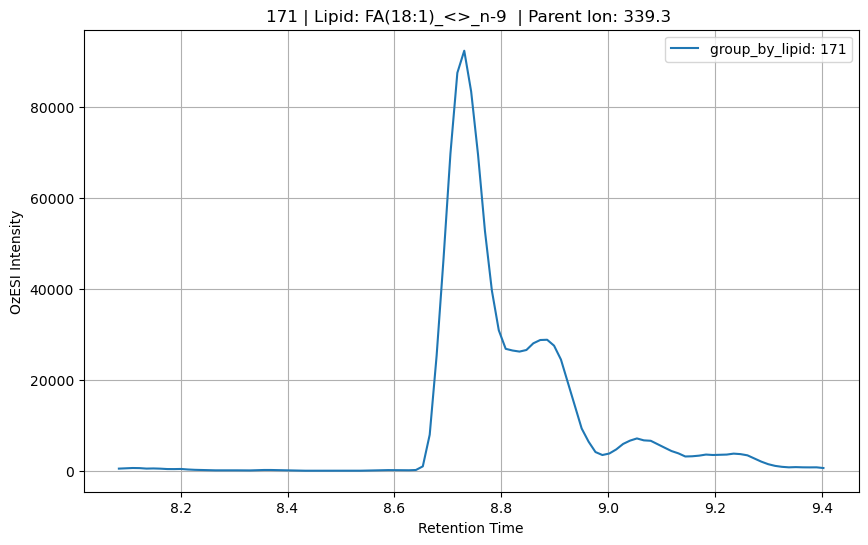

In [73]:
import matplotlib.pyplot as plt

# Function to plot the chromatogram for a specific group_by_lipid value
def plot_chromatogram(df, group_value):
    group_data = df[df['group_by_lipid'] == group_value]
    
    # Ensure the Retention_Time is sorted
    group_data = group_data.sort_values(by='Retention_Time')
    
    # Extract Lipid, Parent Ion, and Isomer values from the first row of the group
    lipid = group_data['Lipid'].iloc[0] if not group_data.empty else "Unknown Lipid"
    parent_ion = group_data['Parent_Ion'].iloc[0] if not group_data.empty else "Unknown Parent Ion"
    # isomer = group_data['Isomer'].iloc[0] if not group_data.empty else "Unknown Isomer"
    
    plt.figure(figsize=(10, 6))
    plt.plot(group_data['Retention_Time'], group_data['OzESI_Intensity'], label=f'group_by_lipid: {group_value}')
    plt.xlabel('Retention Time')
    plt.ylabel('OzESI Intensity')
    
    # Add Lipid, Parent Ion, and Isomer to the title
    plt.title(f'{group_value} | Lipid: {lipid} | Parent Ion: {parent_ion} ')
    
    plt.legend()
    plt.grid(True)
    plt.show()

# Define the specific group_by_lipid value you are interested in
specific_group_by_lipid_value = 171  # Replace with the actual value you are interested in

# Call the function to plot the chromatogram
plot_chromatogram(df, specific_group_by_lipid_value)


# 5 - Analysis

In [74]:
input_dir = 'Projects/AMP/group/ON/'
import glob; num_files = len(glob.glob(f'{input_dir}/*.parquet'))
num_files



41

In [75]:
!sbatch core/backend/analysis_5_AMP.sh

Submitted batch job 20111464


In [76]:
import pandas as pd
df_analysis = pd.read_parquet('Projects/AMP/analysis/ON/df_analysis_5_hippo_WT_m4_FAD263.parquet')
#print number of unqiue values
print(df_analysis['Lipid'].unique())
#print unique lipid values for Lipid FA(20:1)
# df_analysis
# df_analysis[df_analysis['Lipid'].str.contains('24:1', case=False, na=False)]
# df_analysis.to_csv('Projects/STD/analysis/ON/df_analysis_5_FAME.csv', index=False)
df_analysis




['FA(10:1)_<>_n-2 ' 'FA(10:1)_<>_n-3 ' 'FA(10:1)_<>_n-4 '
 'FA(10:1)_<>_n-5 ' 'FA(11:2)_<F>_n-2 ' 'FA(11:2)_<B>_n-2 '
 'FA(11:2)_<F>_n-3 ' 'FA(11:2)_<B>_n-3 ' 'FA(11:2)_<F>_n-4 '
 'FA(11:2)_<B>_n-4 ' 'FA(11:2)_<F>_n-5 ' 'FA(11:2)_<F>_n-6 '
 'FA(11:2)_<F>_n-7 ' 'FA(12:1)_<>_n-2 ' 'FA(12:1)_<>_n-3 '
 'FA(12:1)_<>_n-4 ' 'FA(12:1)_<>_n-5 ' 'FA(12:1)_<>_n-6 '
 'FA(12:1)_<>_n-7 ' 'FA(12:1)_<>_n-8 ' 'FA(12:2)_<F>_n-2 '
 'FA(12:2)_<F>_n-3 ' 'FA(12:2)_<B>_n-3 ' 'FA(12:2)_<F>_n-4 '
 'FA(12:2)_<B>_n-4 ' 'FA(12:2)_<F>_n-5 ' 'FA(12:2)_<B>_n-5 '
 'FA(12:2)_<F>_n-6 ' 'FA(12:2)_<F>_n-7 ' 'FA(13:1)_<>_n-2 '
 'FA(13:1)_<>_n-3 ' 'FA(13:1)_<>_n-4 ' 'FA(13:1)_<>_n-5 '
 'FA(13:1)_<>_n-6 ' 'FA(13:1)_<>_n-7 ' 'FA(13:1)_<>_n-8 '
 'FA(13:1)_<>_n-9 ' 'FA(14:1)_<>_n-2 ' 'FA(14:1)_<>_n-3 '
 'FA(14:1)_<>_n-4 ' 'FA(14:1)_<>_n-5 ' 'FA(14:1)_<>_n-6 '
 'FA(14:1)_<>_n-7 ' 'FA(14:1)_<>_n-8 ' 'FA(14:1)_<>_n-9 '
 'FA(15:1)_<>_n-2 ' 'FA(15:1)_<>_n-3 ' 'FA(15:2)_<F>_n-2 '
 'FA(15:2)_<B>_n-2 ' 'FA(15:2)_<F>_n-3 ' 'FA(15:2)_<B

,Lipid,Retention_Time,OzESI_Intensity,group_by_ion,group_by_lipid,Sample_ID,Transition,Sample,Parent_Ion,Product_Ion,...,Peak_Area,Filter_Column,STD_RT_ON,STD_RT_OFF,STD_RT_Dif,Biology,Genotype,Cage,Mouse,n_value
0,FA(10:1)_<>_n-2,2.903883,857.0,8,0,11162023_WT-m4-hippo-FAD263_AMP_2x_0.05uMd216-...,325.2 -> 183.0,hippo_WT_m4_FAD263,325.2,183.0,...,33.223033,group_by_lipid,8.054833,7.95145,-0.103383,hippo,WT,FAD263,m4,2
1,FA(10:1)_<>_n-2,2.968500,545.0,8,0,11162023_WT-m4-hippo-FAD263_AMP_2x_0.05uMd216-...,325.2 -> 183.0,hippo_WT_m4_FAD263,325.2,183.0,...,21.127833,group_by_lipid,8.054833,7.95145,-0.103383,hippo,WT,FAD263,m4,2
2,FA(10:1)_<>_n-2,3.071867,1592.0,8,0,11162023_WT-m4-hippo-FAD263_AMP_2x_0.05uMd216-...,325.2 -> 183.0,hippo_WT_m4_FAD263,325.2,183.0,...,102.843200,group_by_lipid,8.054833,7.95145,-0.103383,hippo,WT,FAD263,m4,2
3,FA(10:1)_<>_n-2,3.653283,4916.0,8,0,11162023_WT-m4-hippo-FAD263_AMP_2x_0.05uMd216-...,325.2 -> 183.0,hippo_WT_m4_FAD263,325.2,183.0,...,317.573600,group_by_lipid,8.054833,7.95145,-0.103383,hippo,WT,FAD263,m4,2
4,FA(10:1)_<>_n-2,3.847083,789620.0,8,0,11162023_WT-m4-hippo-FAD263_AMP_2x_0.05uMd216-...,325.2 -> 183.0,hippo_WT_m4_FAD263,325.2,183.0,...,40810.193667,group_by_lipid,8.054833,7.95145,-0.103383,hippo,WT,FAD263,m4,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
742,FA(9:1)_<>_n-2,3.537400,981.0,6,457,11162023_WT-m4-hippo-FAD263_AMP_2x_0.05uMd216-...,311.3 -> 183.0,hippo_WT_m4_FAD263,311.3,183.0,...,25.342500,group_by_lipid,8.054833,7.95145,-0.103383,hippo,WT,FAD263,m4,2
743,FA(9:1)_<>_n-2,3.614917,39373.0,6,457,11162023_WT-m4-hippo-FAD263_AMP_2x_0.05uMd216-...,311.3 -> 183.0,hippo_WT_m4_FAD263,311.3,183.0,...,2034.927883,group_by_lipid,8.054833,7.95145,-0.103383,hippo,WT,FAD263,m4,2
744,FA(9:1)_<>_n-2,3.950850,523.0,6,457,11162023_WT-m4-hippo-FAD263_AMP_2x_0.05uMd216-...,311.3 -> 183.0,hippo_WT_m4_FAD263,311.3,183.0,...,27.030383,group_by_lipid,8.054833,7.95145,-0.103383,hippo,WT,FAD263,m4,2
745,FA(9:1)_<>_n-3,3.163117,1624.0,4,458,11162023_WT-m4-hippo-FAD263_AMP_2x_0.05uMd216-...,297.2 -> 183.0,hippo_WT_m4_FAD263,297.2,183.0,...,83.933733,group_by_lipid,8.054833,7.95145,-0.103383,hippo,WT,FAD263,m4,3


In [109]:
import pandas as pd

# Filter rows where 'Species' is '18:1'
filtered_df = df_analysis[df_analysis['Species'] == '18:1']
#print unique column names
print(filtered_df.columns)

filtered_df


Index(['Lipid', 'Retention_Time', 'OzESI_Intensity', 'group_by_ion',
       'group_by_lipid', 'Sample_ID', 'Transition', 'Sample', 'Parent_Ion',
       'Product_Ion', 'Species', 'Class', 'Possible_Lipids', 'Peak_Height',
       'FWHM', 'Peak_Width', 'Peak_Area', 'Filter_Column', 'STD_RT_ON',
       'STD_RT_OFF', 'STD_RT_Dif', 'Biology', 'Genotype', 'Cage', 'Mouse',
       'n_value', 'Adjusted_RT', 'Isomer'],
      dtype='object')


,Lipid,Retention_Time,OzESI_Intensity,group_by_ion,group_by_lipid,Sample_ID,Transition,Sample,Parent_Ion,Product_Ion,...,STD_RT_ON,STD_RT_OFF,STD_RT_Dif,Biology,Genotype,Cage,Mouse,n_value,Adjusted_RT,Isomer
334,FA(18:1)_<>_n-2,8.364300,645.0,31,164,11162023_WT-m4-hippo-FAD263_AMP_2x_0.05uMd216-...,437.4 -> 183.0,hippo_WT_m4_FAD263,437.4,183.0,...,8.054833,7.95145,-0.103383,hippo,WT,FAD263,m4,2,8.260917,1
335,FA(18:1)_<>_n-2,8.558100,5021.0,31,164,11162023_WT-m4-hippo-FAD263_AMP_2x_0.05uMd216-...,437.4 -> 183.0,hippo_WT_m4_FAD263,437.4,183.0,...,8.054833,7.95145,-0.103383,hippo,WT,FAD263,m4,2,8.454717,2
336,FA(18:1)_<>_n-2,8.661467,2229.0,31,164,11162023_WT-m4-hippo-FAD263_AMP_2x_0.05uMd216-...,437.4 -> 183.0,hippo_WT_m4_FAD263,437.4,183.0,...,8.054833,7.95145,-0.103383,hippo,WT,FAD263,m4,2,8.558083,3
337,FA(18:1)_<>_n-2,8.894033,375792.0,31,164,11162023_WT-m4-hippo-FAD263_AMP_2x_0.05uMd216-...,437.4 -> 183.0,hippo_WT_m4_FAD263,437.4,183.0,...,8.054833,7.95145,-0.103383,hippo,WT,FAD263,m4,2,8.790650,4
338,FA(18:1)_<>_n-2,9.165350,235323.0,31,164,11162023_WT-m4-hippo-FAD263_AMP_2x_0.05uMd216-...,437.4 -> 183.0,hippo_WT_m4_FAD263,437.4,183.0,...,8.054833,7.95145,-0.103383,hippo,WT,FAD263,m4,2,9.061967,5
339,FA(18:1)_<>_n-3,8.649367,63317.0,28,165,11162023_WT-m4-hippo-FAD263_AMP_2x_0.05uMd216-...,423.3 -> 183.0,hippo_WT_m4_FAD263,423.3,183.0,...,8.054833,7.95145,-0.103383,hippo,WT,FAD263,m4,3,8.545983,1
340,FA(18:1)_<>_n-3,8.894850,37139.0,28,165,11162023_WT-m4-hippo-FAD263_AMP_2x_0.05uMd216-...,423.3 -> 183.0,hippo_WT_m4_FAD263,423.3,183.0,...,8.054833,7.95145,-0.103383,hippo,WT,FAD263,m4,3,8.791467,2
341,FA(18:1)_<>_n-3,9.101567,11480.0,28,165,11162023_WT-m4-hippo-FAD263_AMP_2x_0.05uMd216-...,423.3 -> 183.0,hippo_WT_m4_FAD263,423.3,183.0,...,8.054833,7.95145,-0.103383,hippo,WT,FAD263,m4,3,8.998183,3
342,FA(18:1)_<>_n-3,9.243700,13385.0,28,165,11162023_WT-m4-hippo-FAD263_AMP_2x_0.05uMd216-...,423.3 -> 183.0,hippo_WT_m4_FAD263,423.3,183.0,...,8.054833,7.95145,-0.103383,hippo,WT,FAD263,m4,3,9.140317,4
343,FA(18:1)_<>_n-4,8.895467,739.0,25,166,11162023_WT-m4-hippo-FAD263_AMP_2x_0.05uMd216-...,409.3 -> 183.0,hippo_WT_m4_FAD263,409.3,183.0,...,8.054833,7.95145,-0.103383,hippo,WT,FAD263,m4,4,8.792083,1


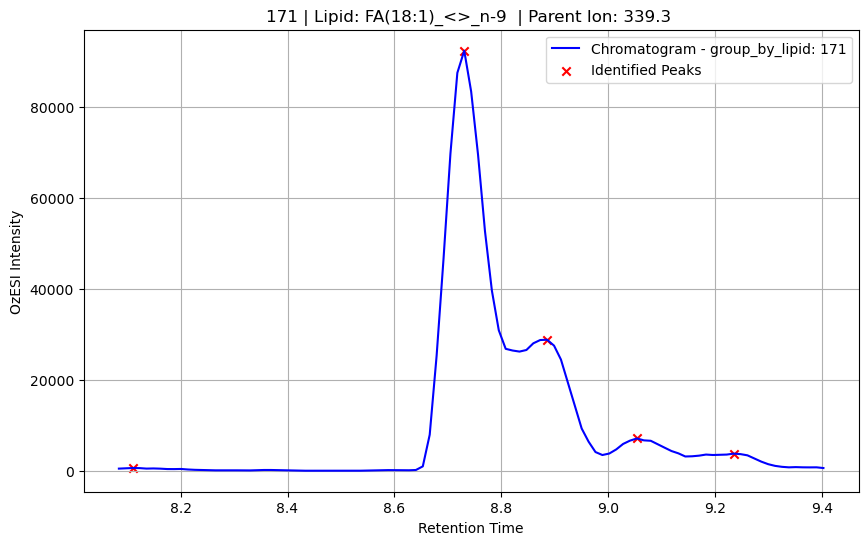

In [77]:
import matplotlib.pyplot as plt

# Function to plot the chromatogram for a specific group_by_lipid value, including analysis data (peaks)
def plot_chromatogram(df_grouped, df_analysis, group_value):
    """
    Plot the chromatogram for a specific group_by_lipid value.

    :param df_grouped: DataFrame containing the original grouped data.
    :param df_analysis: DataFrame containing the analyzed data (peaks).
    :param group_value: The specific group_by_lipid value to plot.
    """
    # Filter data for the specific group_by_lipid value
    group_data = df_grouped[df_grouped['group_by_lipid'] == group_value]
    analysis_data = df_analysis[df_analysis['group_by_lipid'] == group_value]
    
    # Ensure the Retention_Time is sorted in both DataFrames
    group_data = group_data.sort_values(by='Retention_Time')
    analysis_data = analysis_data.sort_values(by='Retention_Time')

    # Extract Lipid, Parent Ion, and Isomer values from the first row of the group
    lipid = group_data['Lipid'].iloc[0] if not group_data.empty else "Unknown Lipid"
    parent_ion = group_data['Parent_Ion'].iloc[0] if not group_data.empty else "Unknown Parent Ion"
    # isomer = group_data['Isomer'].iloc[0] if not group_data.empty else "Unknown Isomer"
    
    # Plot the grouped data (original chromatogram)
    plt.figure(figsize=(10, 6))
    plt.plot(group_data['Retention_Time'], group_data['OzESI_Intensity'], label=f'Chromatogram - group_by_lipid: {group_value}', color='blue')
    
    # Overlay the analysis data (peaks)
    if not analysis_data.empty:
        plt.scatter(analysis_data['Retention_Time'], analysis_data['OzESI_Intensity'], color='red', marker='x', label='Identified Peaks')

    # Add labels and title
    plt.xlabel('Retention Time')
    plt.ylabel('OzESI Intensity')
    
    # Add Lipid, Parent Ion, and Isomer to the title
    plt.title(f'{group_value} | Lipid: {lipid} | Parent Ion: {parent_ion} ')
    
    # Add a legend and grid
    plt.legend()
    plt.grid(True)
    
    # Show the plot
    plt.show()

# Example: Define the specific group_by_lipid value you are interested in
specific_group_by_lipid_value = 171  # Replace with the actual value you are interested in

# Call the function to plot the chromatogram and analysis data
plot_chromatogram(df, df_analysis, specific_group_by_lipid_value)


In [117]:
def filter_ozON_by_ozOFF(df_analysis, off_possible, retention_time_tolerance=0.3):
    """
    Filters df_analysis (OzON data) based on Retention_Time and Species from off_possible (OzOFF data)
    with a user-defined tolerance for retention times, adjusting the OzON Retention_Time by STD_RT_Dif if it exists.
    """
    # Create a new column Adjusted_RT based on Retention_Time and STD_RT_Dif
    if 'STD_RT_Dif' in df_analysis.columns:
        df_analysis['Adjusted_RT'] = df_analysis['Retention_Time'] + df_analysis['STD_RT_Dif']
    else:
        df_analysis['Adjusted_RT'] = df_analysis['Retention_Time']

    # Extract Species from Lipid names if not already present
    if 'Species' not in df_analysis.columns:
        df_analysis['Species'] = df_analysis['Lipid'].str.extract(r'\((\d+:\d+)\)')[0]

    # Extract n-position from Lipid names
    df_analysis['n_position'] = df_analysis['Lipid'].str.extract(r'n-(\d+)')[0].astype(int)

    # Initialize an empty DataFrame to store the filtered results
    filtered_df = pd.DataFrame()

    # Iterate over each row in the off_possible (OzOFF data)
    for _, row in off_possible.iterrows():
        species = row['Species']
        isomer_off = row['Isomer']
        retention_time_off = row['Retention_Time']

        # Define the retention time window based on the tolerance
        retention_time_start = retention_time_off - retention_time_tolerance
        retention_time_end = retention_time_off + retention_time_tolerance

        # Filter df_analysis based only on species and retention time window
        filtered_rows = df_analysis[
            (df_analysis['Species'] == species) &
            (df_analysis['Adjusted_RT'] >= retention_time_start) &
            (df_analysis['Adjusted_RT'] <= retention_time_end)
        ]

        # Print matching action details for each row in df_analysis
        for _, analysis_row in df_analysis.iterrows():
            lipid = analysis_row['Lipid']
            retention_time_on = analysis_row['Adjusted_RT']
            n_position = analysis_row['n_position']
            
            is_match = (
                (analysis_row['Species'] == species) and
                (retention_time_start <= retention_time_on <= retention_time_end)
            )
            
            print(f"Matching OzON: Lipid={lipid} (n-{n_position}), Adjusted_RT={retention_time_on} "
                  f"with OzOFF: Species={species}, Isomer={isomer_off}, Retention_Time={retention_time_off}")
            
            if is_match:
                print("Result: Match")
            else:
                print("Result: No Match")

        # Add the OzOFF isomer number to the matched rows
        if not filtered_rows.empty:
            filtered_rows = filtered_rows.assign(OzOFF_Isomer=isomer_off)
        
        # Concatenate the filtered results to the overall filtered_df
        filtered_df = pd.concat([filtered_df, filtered_rows], ignore_index=True)

    # Identify lipids that were filtered out
    for _, row in df_analysis.iterrows():
        if row['Lipid'] not in filtered_df['Lipid'].values and row['Species'] == "18:1":
            reason = "No matching OzOFF entry found within the retention time tolerance."
            print(f"Filtered out Lipid: {row['Lipid']} (n-{row['n_position']}) because {reason}")

    # Debugging: Print the final filtered DataFrame to verify its content
    print("Final filtered DataFrame:")
    print(filtered_df)

    return filtered_df



# # Example usage:
# # Load the DataFrames
# df_analysis = pd.read_parquet('Projects/AMP/analysis/ON/df_analysis_5_hippo_WT_m4_FAD263.parquet')
# # Filter df_analysis for Species 18:1 before proceeding
# df_analysis = df_analysis[df_analysis['Species'] == '18:1']

# off_possible = pd.read_parquet('Projects/AMP/analysis/OFF/off_possible/df_analysis_5_hippo_WT_m4_FAD263_OFF_offpossible.parquet')

# Example usage:
# Load the DataFrames
df_analysis = pd.read_parquet('Projects/AMP/analysis/ON/df_analysis_5_hippo_WT_m1_FAD245.parquet')
# Filter df_analysis for Species 18:1 before proceeding
df_analysis = df_analysis[df_analysis['Species'] == '18:1']

off_possible = pd.read_parquet('Projects/AMP/analysis/OFF/off_possible/df_analysis_5_hippo_WT_m1_FAD245_OFF_offpossible.parquet')

# Set the retention time tolerance (user can modify this)
retention_time_tolerance = 0.1

# Call the function to filter the OzON data based on OzOFF criteria and adjust by STD_RT_Dif
filtered_ozON = filter_ozON_by_ozOFF(df_analysis, off_possible, retention_time_tolerance)


# Display the filtered data with Isomer column
#sort by lipid
filtered_ozON = filtered_ozON.sort_values(by='Lipid')
filtered_ozON


Matching OzON: Lipid=FA(18:1)_<>_n-2  (n-2), Adjusted_RT=8.493500000000001 with OzOFF: Species=10:1, Isomer=2, Retention_Time=4.0277666666666665
Result: No Match
Matching OzON: Lipid=FA(18:1)_<>_n-2  (n-2), Adjusted_RT=8.764833333333335 with OzOFF: Species=10:1, Isomer=2, Retention_Time=4.0277666666666665
Result: No Match
Matching OzON: Lipid=FA(18:1)_<>_n-2  (n-2), Adjusted_RT=8.868183333333334 with OzOFF: Species=10:1, Isomer=2, Retention_Time=4.0277666666666665
Result: No Match
Matching OzON: Lipid=FA(18:1)_<>_n-2  (n-2), Adjusted_RT=9.03615 with OzOFF: Species=10:1, Isomer=2, Retention_Time=4.0277666666666665
Result: No Match
Matching OzON: Lipid=FA(18:1)_<>_n-3  (n-3), Adjusted_RT=8.894850000000002 with OzOFF: Species=10:1, Isomer=2, Retention_Time=4.0277666666666665
Result: No Match
Matching OzON: Lipid=FA(18:1)_<>_n-3  (n-3), Adjusted_RT=8.998216666666668 with OzOFF: Species=10:1, Isomer=2, Retention_Time=4.0277666666666665
Result: No Match
Matching OzON: Lipid=FA(18:1)_<>_n-3  

,Lipid,Retention_Time,OzESI_Intensity,group_by_ion,group_by_lipid,Sample_ID,Transition,Sample,Parent_Ion,Product_Ion,...,STD_RT_OFF,STD_RT_Dif,Biology,Genotype,Cage,Mouse,n_value,Adjusted_RT,n_position,OzOFF_Isomer
20,FA(18:1)_<>_n-10,8.950617,11064.0,8,128,11162023_WT-m1-hippo-FAD245_AMP_2x_0.05uMd216-...,325.2 -> 183.0,hippo_WT_m1_FAD245,325.2,183.0,...,7.899783,0.038767,hippo,WT,FAD245,m1,10,8.989383,10,2.0
6,FA(18:1)_<>_n-10,8.679283,6275.0,8,128,11162023_WT-m1-hippo-FAD245_AMP_2x_0.05uMd216-...,325.2 -> 183.0,hippo_WT_m1_FAD245,325.2,183.0,...,7.899783,0.038767,hippo,WT,FAD245,m1,10,8.718050,10,1.0
21,FA(18:1)_<>_n-11,8.976867,1704.0,6,129,11162023_WT-m1-hippo-FAD245_AMP_2x_0.05uMd216-...,311.3 -> 183.0,hippo_WT_m1_FAD245,311.3,183.0,...,7.899783,0.038767,hippo,WT,FAD245,m1,11,9.015633,11,2.0
7,FA(18:1)_<>_n-11,8.718450,505.0,6,129,11162023_WT-m1-hippo-FAD245_AMP_2x_0.05uMd216-...,311.3 -> 183.0,hippo_WT_m1_FAD245,311.3,183.0,...,7.899783,0.038767,hippo,WT,FAD245,m1,11,8.757217,11,1.0
9,FA(18:1)_<>_n-2,8.997383,1569143.0,31,135,11162023_WT-m1-hippo-FAD245_AMP_2x_0.05uMd216-...,437.4 -> 183.0,hippo_WT_m1_FAD245,437.4,183.0,...,7.899783,0.038767,hippo,WT,FAD245,m1,2,9.036150,2,2.0
8,FA(18:1)_<>_n-2,8.829417,744957.0,31,135,11162023_WT-m1-hippo-FAD245_AMP_2x_0.05uMd216-...,437.4 -> 183.0,hippo_WT_m1_FAD245,437.4,183.0,...,7.899783,0.038767,hippo,WT,FAD245,m1,2,8.868183,2,2.0
11,FA(18:1)_<>_n-3,8.959450,16742.0,28,136,11162023_WT-m1-hippo-FAD245_AMP_2x_0.05uMd216-...,423.3 -> 183.0,hippo_WT_m1_FAD245,423.3,183.0,...,7.899783,0.038767,hippo,WT,FAD245,m1,3,8.998217,3,2.0
10,FA(18:1)_<>_n-3,8.856083,21828.0,28,136,11162023_WT-m1-hippo-FAD245_AMP_2x_0.05uMd216-...,423.3 -> 183.0,hippo_WT_m1_FAD245,423.3,183.0,...,7.899783,0.038767,hippo,WT,FAD245,m1,3,8.894850,3,2.0
12,FA(18:1)_<>_n-4,8.843783,1185.0,25,137,11162023_WT-m1-hippo-FAD245_AMP_2x_0.05uMd216-...,409.3 -> 183.0,hippo_WT_m1_FAD245,409.3,183.0,...,7.899783,0.038767,hippo,WT,FAD245,m1,4,8.882550,4,2.0
13,FA(18:1)_<>_n-4,9.011750,502.0,25,137,11162023_WT-m1-hippo-FAD245_AMP_2x_0.05uMd216-...,409.3 -> 183.0,hippo_WT_m1_FAD245,409.3,183.0,...,7.899783,0.038767,hippo,WT,FAD245,m1,4,9.050517,4,2.0


# PRe 6 - Match Off possible and OzON data file names

In [18]:
import os
import glob
import pandas as pd

def list_files_in_dirs(dir1, dir2, extension='*.parquet'):
    """
    Lists file names from two directories and creates keys for matching.

    Parameters:
    dir1 (str): Path to the first directory.
    dir2 (str): Path to the second directory.
    extension (str): File extension to match (default: '*.parquet').

    Returns:
    DataFrame: DataFrame containing file names from both directories and their keys.
    """
    # Get list of files in both directories
    files1 = glob.glob(os.path.join(dir1, extension))
    files2 = glob.glob(os.path.join(dir2, extension))

    # Extract file names without the directory path
    file_names1 = [os.path.basename(f) for f in files1]
    file_names2 = [os.path.basename(f) for f in files2]

    # Create keys for matching based on file names, excluding the '5_'
    keys_ozoff = ["_".join(f.split('_')[2:7]) for f in file_names1]
    keys_ozon = ["_".join(f.split('_')[2:7]) for f in file_names2]

    # Remove '5_' prefix from keys if present
    keys_ozoff = [key.replace('5_', '', 1) if key.startswith('5_') else key for key in keys_ozoff]
    keys_ozon = [key.replace('5_', '', 1) if key.startswith('5_') else key for key in keys_ozon]

    # Extract additional information after the current key setup
    additional_info_ozoff = ["_".join(f.split('_')[7:]) for f in file_names1]
    additional_info_ozon = ["_".join(f.split('_')[7:]) for f in file_names2]

    # Create DataFrame with two columns for each directory and their keys
    file_list_df = pd.DataFrame({
        'OzOFF Files': file_names1,
        'OzOFF Key': keys_ozoff,
        'OzOFF Additional Info': additional_info_ozoff,
        'OzON Files': file_names2,
        'OzON Key': keys_ozon,
        'OzON Additional Info': additional_info_ozon
    })

    return file_list_df

def count_key_matches(file_list_df):
    """
    Prints matches and non-matches between OzOFF and OzON keys, including additional information.

    Parameters:
    file_list_df (DataFrame): DataFrame containing file names and keys from both directories.

    """
    ozoff_keys = set(file_list_df['OzOFF Key'])
    ozon_keys = set(file_list_df['OzON Key'])

    # Find the intersection of both sets to determine matches
    matching_keys = ozoff_keys.intersection(ozon_keys)

    # Print each match with additional information
    for key in matching_keys:
        ozoff_info = file_list_df[file_list_df['OzOFF Key'] == key]['OzOFF Additional Info'].values
        ozon_info = file_list_df[file_list_df['OzON Key'] == key]['OzON Additional Info'].values
        print(f"MATCH\nOzON Key: {key}\nOzOFF Key: {key}\nOzON Additional Info: {ozon_info}\nOzOFF Additional Info: {ozoff_info}\n")

    # Find non-matching keys
    ozon_nonmatches = ozon_keys - matching_keys
    ozoff_nonmatches = ozoff_keys - matching_keys

    # Print non-matching OzON keys
    print("OzON NonMatches:")
    for key in ozon_nonmatches:
        print(key)

    # Print non-matching OzOFF keys
    print("\nOzOFF NonMatches:")
    for key in ozoff_nonmatches:
        print(key)

    # Print counts of matches and non-matches
    print(f"\nNumber of matches: {len(matching_keys)}")
    print(f"Number of OzON non-matches: {len(ozon_nonmatches)}")
    print(f"Number of OzOFF non-matches: {len(ozoff_nonmatches)}")

# Example usage
dir1 = 'Projects/AMP/analysis/OFF/off_possible/'
dir2 = 'Projects/AMP/analysis/ON/'
file_list_df = list_files_in_dirs(dir1, dir2)

# Print file list DataFrame
print(file_list_df)

# Save file list to an Excel file
file_list_df.to_excel('file_list_with_keys.xlsx', index=False)

# Count the number of matches in keys and print matches and non-matches
count_key_matches(file_list_df)


                                          OzOFF Files  \
0       df_analysis_5_Unknown_OFF_offpossible.parquet   
1   df_analysis_5_cortex_5xFAD_m1_FAD231_OFF_offpo...   
2   df_analysis_5_cortex_5xFAD_m1_FAD249_OFF_offpo...   
3   df_analysis_5_hippo_5xFAD_m2_FAD257_OFF_offpos...   
4   df_analysis_5_dienc_5xFAD_m2_FAD257_OFF_offpos...   
5   df_analysis_5_cortex_WT_m5_FAD259_OFF_offpossi...   
6   df_analysis_5_hippo_5xFAD_m1_FAD231_OFF_offpos...   
7   df_analysis_5_dienc_WT_m3_FAD263_OFF_offpossib...   
8   df_analysis_5_dienc_WT_m1_FAD245_OFF_offpossib...   
9   df_analysis_5_hippo_5xFAD_m1_FAD249_OFF_offpos...   
10  df_analysis_5_hippo_WT_m1_FAD245_OFF_offpossib...   
11  df_analysis_5_hippo_WT_m3_FAD263_OFF_offpossib...   
12  df_analysis_5_cereb_5xFAD_m2_FAD231_OFF_offpos...   
13  df_analysis_5_cortex_5xFAD_m2_FAD257_OFF_offpo...   
14  df_analysis_5_cereb_WT_m5_FAD259_OFF_offpossib...   
15  df_analysis_5_cereb_WT_m3_FAD263_OFF_offpossib...   
16  df_analysis_5_cereb_WT_m1_F

# 6 - loading filter Function for OzON OzOFF from python file 

In [1]:
# print len of dir
input_dir = 'Projects/AMP/analysis/OFF/off_possible/'
input_dir2 = 'Projects/AMP/analysis/ON/'
import glob; num_files = len(glob.glob(f'{input_dir}/*.parquet'))
import glob; num_files2 = len(glob.glob(f'{input_dir2}/*.parquet'))

print(num_files)
print(num_files2)   

41
41


In [3]:
import pandas as pd
from core.python.isomer_filter_6_AMP import filter_ozON_by_ozOFF

# Define input and output directories
input_dir = 'Projects/AMP/analysis/ON/'
off_possible_dir = 'Projects/AMP/analysis/OFF/off_possible/'
isomer_filter_output = 'Projects/AMP/isomer_filter_6/'

# Call the function to process all parquet files in the input directory
filter_ozON_by_ozOFF(input_dir, off_possible_dir, retention_time_tolerance=0.15, isomer_filter_output=isomer_filter_output)




Starting file matching process...
Looking for parquet files in:
OzOFF directory: Projects/AMP/analysis/OFF/off_possible/
OzON directory: Projects/AMP/analysis/ON/

OzOFF Keys:
1. File: df_analysis_5_Unknown_OFF_offpossible.parquet
   Key: Unknown_OFF_offpossible

2. File: df_analysis_5_cortex_5xFAD_m1_FAD231_OFF_offpossible.parquet
   Key: cortex_5xFAD_m1_FAD231

3. File: df_analysis_5_cortex_5xFAD_m1_FAD249_OFF_offpossible.parquet
   Key: cortex_5xFAD_m1_FAD249

4. File: df_analysis_5_hippo_5xFAD_m2_FAD257_OFF_offpossible.parquet
   Key: hippo_5xFAD_m2_FAD257

5. File: df_analysis_5_dienc_5xFAD_m2_FAD257_OFF_offpossible.parquet
   Key: dienc_5xFAD_m2_FAD257

6. File: df_analysis_5_cortex_WT_m5_FAD259_OFF_offpossible.parquet
   Key: cortex_WT_m5_FAD259

7. File: df_analysis_5_hippo_5xFAD_m1_FAD231_OFF_offpossible.parquet
   Key: hippo_5xFAD_m1_FAD231

8. File: df_analysis_5_dienc_WT_m3_FAD263_OFF_offpossible.parquet
   Key: dienc_WT_m3_FAD263

9. File: df_analysis_5_dienc_WT_m1_FAD245

# updating funcion

In [4]:
# filtered_lipids = filtered_ozON[filtered_ozON['Lipid'].str.contains('18:1', case=False, na=False)]
# sorted_filtered_lipids = filtered_lipids.sort_values(by='OzESI_Intensity', ascending=False)
# print(sorted_filtered_lipids['Species'].unique())
# sorted_filtered_lipids = sorted_filtered_lipids.sort_values(by='Lipid', ascending=True)
# sorted_filtered_lipids

In [14]:
df = pd.read_parquet('Projects/AMP/isomer_filter_6/hippo_WT_m5_FAD263_isomer_filtered_6.parquet')

# df = df[df['Lipid'].str.contains('20:1', case=False, na=False)]
# df = df.sort_values(by='OzESI_Intensity', ascending=False)
df
filtered_lipids = df[df['Lipid'].str.contains('18:1', case=False, na=False)]
sorted_filtered_lipids = filtered_lipids.sort_values(by='OzESI_Intensity', ascending=False)
print(sorted_filtered_lipids['Species'].unique())
sorted_filtered_lipids = sorted_filtered_lipids.sort_values(by='Lipid', ascending=True)
sorted_filtered_lipids
df


['18:1']


,Lipid,Retention_Time,OzESI_Intensity,group_by_ion,group_by_lipid,Sample_ID,Transition,Sample,Parent_Ion,Product_Ion,...,STD_RT_OFF,STD_RT_Dif,Biology,Genotype,Cage,Mouse,n_value,Adjusted_RT,n_position,OzOFF_Isomer
0,FA(10:1)_<>_n-2,3.330250,865.0,8,0,11162023_WT-m5-hippo-FAD263_AMP_2x_0.05uMd216-...,325.2 -> 183.0,hippo_WT_m5_FAD263,325.2,183.0,...,7.95145,0.0,hippo,WT,FAD263,m5,2,3.330250,2,1.0
1,FA(10:1)_<>_n-2,3.446533,659.0,8,0,11162023_WT-m5-hippo-FAD263_AMP_2x_0.05uMd216-...,325.2 -> 183.0,hippo_WT_m5_FAD263,325.2,183.0,...,7.95145,0.0,hippo,WT,FAD263,m5,2,3.446533,2,1.0
2,FA(10:1)_<>_n-2,3.536983,562.0,8,0,11162023_WT-m5-hippo-FAD263_AMP_2x_0.05uMd216-...,325.2 -> 183.0,hippo_WT_m5_FAD263,325.2,183.0,...,7.95145,0.0,hippo,WT,FAD263,m5,2,3.536983,2,1.0
3,FA(10:1)_<>_n-3,3.434017,2234.0,6,1,11162023_WT-m5-hippo-FAD263_AMP_2x_0.05uMd216-...,311.3 -> 183.0,hippo_WT_m5_FAD263,311.3,183.0,...,7.95145,0.0,hippo,WT,FAD263,m5,3,3.434017,3,1.0
4,FA(10:1)_<>_n-3,3.601983,63102.0,6,1,11162023_WT-m5-hippo-FAD263_AMP_2x_0.05uMd216-...,311.3 -> 183.0,hippo_WT_m5_FAD263,311.3,183.0,...,7.95145,0.0,hippo,WT,FAD263,m5,3,3.601983,3,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
409,FA(22:6)_<FFFFF>_n-7,12.861383,1321.0,28,429,11162023_WT-m5-hippo-FAD263_AMP_2x_0.05uMd216-...,423.3 -> 183.0,hippo_WT_m5_FAD263,423.3,183.0,...,7.95145,0.0,hippo,WT,FAD263,m5,7,12.861383,7,2.0
410,FA(22:6)_<FFFFF>_n-7,13.042267,957.0,28,429,11162023_WT-m5-hippo-FAD263_AMP_2x_0.05uMd216-...,423.3 -> 183.0,hippo_WT_m5_FAD263,423.3,183.0,...,7.95145,0.0,hippo,WT,FAD263,m5,7,13.042267,7,2.0
411,FA(22:6)_<FFFFF>_n-7,13.068117,929.0,28,429,11162023_WT-m5-hippo-FAD263_AMP_2x_0.05uMd216-...,423.3 -> 183.0,hippo_WT_m5_FAD263,423.3,183.0,...,7.95145,0.0,hippo,WT,FAD263,m5,7,13.068117,7,2.0
412,FA(8:1)_<>_n-2,3.343983,13059.0,4,432,11162023_WT-m5-hippo-FAD263_AMP_2x_0.05uMd216-...,297.2 -> 183.0,hippo_WT_m5_FAD263,297.2,183.0,...,7.95145,0.0,hippo,WT,FAD263,m5,2,3.343983,2,1.0


# 7 -  fame filtering 

In [23]:
from core.python.fame_filter_AMP_7 import filter_ozon_by_fame_std
import pandas as pd
# Define input and output directories
input_dir = 'Projects/AMP/isomer_filter_6/'
output_dir = 'Projects/AMP/fame_filter_7/'

# Load fame_std DataFrame (this should be loaded beforehand)
fame_std = pd.read_parquet('Projects/STD/off_possible/FAME_off_possible_top2.parquet')

# Call the function
filter_ozon_by_fame_std(input_dir, fame_std, output_dir, fame_rt_window=0.5)


Log saved to Projects/AMP/fame_filter_7/log/cereb_WT_m4_FAD263_fame_filter_log_7.txt
Removed lipids saved to Projects/AMP/fame_filter_7/log/cereb_WT_m4_FAD263_fame_filter_removed_lipids_7.csv
Filtered data saved to Projects/AMP/fame_filter_7/cereb_WT_m4_FAD263_fame_filter_7.parquet
Log saved to Projects/AMP/fame_filter_7/log/cortex_5xFAD_m1_FAD249_fame_filter_log_7.txt
Removed lipids saved to Projects/AMP/fame_filter_7/log/cortex_5xFAD_m1_FAD249_fame_filter_removed_lipids_7.csv
Filtered data saved to Projects/AMP/fame_filter_7/cortex_5xFAD_m1_FAD249_fame_filter_7.parquet
Log saved to Projects/AMP/fame_filter_7/log/hippo_WT_m2_FAD249_fame_filter_log_7.txt
Removed lipids saved to Projects/AMP/fame_filter_7/log/hippo_WT_m2_FAD249_fame_filter_removed_lipids_7.csv
Filtered data saved to Projects/AMP/fame_filter_7/hippo_WT_m2_FAD249_fame_filter_7.parquet
Log saved to Projects/AMP/fame_filter_7/log/dienc_5xFAD_m1_FAD231_fame_filter_log_7.txt
Removed lipids saved to Projects/AMP/fame_filter_7/

In [1]:
import pandas as pd
df7 = pd.read_parquet('Projects/AMP/fame_filter_7/cortex_WT_m5_FAD263_fame_filter_7.parquet')
df7.to_csv('Projects/AMP/fame_filter_7/csv/cortex_WT_m5_FAD263_fame_filter_7.csv', index=False)


filtered_lipids = df7[df7['Lipid'].str.contains('18:1', case=False, na=False)]
sorted_filtered_lipids = filtered_lipids.sort_values(by='OzESI_Intensity', ascending=False)
print(sorted_filtered_lipids['Species'].unique())
sorted_filtered_lipids = sorted_filtered_lipids.sort_values(by='Lipid', ascending=True)
sorted_filtered_lipids

df7

['18:1']


,Lipid,Retention_Time,OzESI_Intensity,group_by_ion,group_by_lipid,Sample_ID,Transition,Sample,Parent_Ion,Product_Ion,...,STD_RT_ON,STD_RT_OFF,STD_RT_Dif,Biology,Genotype,Cage,Mouse,n_value,Adjusted_RT,Isomer
0,FA(10:1)_<>_n-3,3.421117,3298.0,6,1,11162023_WT-m5-cortex-FAD263_AMP_2x_0.05uMd216...,311.3 -> 183.0,cortex_WT_m5_FAD263,311.3,183.0,...,7.964367,7.964383,0.000017,cortex,WT,FAD263,m5,3,3.421133,1
1,FA(12:1)_<>_n-2,3.148583,5196.0,12,8,11162023_WT-m5-cortex-FAD263_AMP_2x_0.05uMd216...,353.3 -> 183.0,cortex_WT_m5_FAD263,353.3,183.0,...,7.964367,7.964383,0.000017,cortex,WT,FAD263,m5,2,3.148600,1
2,FA(12:1)_<>_n-6,3.176033,1197.0,4,12,11162023_WT-m5-cortex-FAD263_AMP_2x_0.05uMd216...,297.2 -> 183.0,cortex_WT_m5_FAD263,297.2,183.0,...,7.964367,7.964383,0.000017,cortex,WT,FAD263,m5,6,3.176050,1
3,FA(12:1)_<>_n-7,3.072883,14326.0,3,13,11162023_WT-m5-cortex-FAD263_AMP_2x_0.05uMd216...,283.2 -> 183.0,cortex_WT_m5_FAD263,283.2,183.0,...,7.964367,7.964383,0.000017,cortex,WT,FAD263,m5,7,3.072900,1
4,FA(13:1)_<>_n-6,3.421117,3298.0,6,22,11162023_WT-m5-cortex-FAD263_AMP_2x_0.05uMd216...,311.3 -> 183.0,cortex_WT_m5_FAD263,311.3,183.0,...,7.964367,7.964383,0.000017,cortex,WT,FAD263,m5,6,3.421133,1
5,FA(13:1)_<>_n-5,3.627433,3523.0,8,21,11162023_WT-m5-cortex-FAD263_AMP_2x_0.05uMd216...,325.2 -> 183.0,cortex_WT_m5_FAD263,325.2,183.0,...,7.964367,7.964383,0.000017,cortex,WT,FAD263,m5,5,3.627450,2
6,FA(13:1)_<>_n-6,3.602000,70789.0,6,22,11162023_WT-m5-cortex-FAD263_AMP_2x_0.05uMd216...,311.3 -> 183.0,cortex_WT_m5_FAD263,311.3,183.0,...,7.964367,7.964383,0.000017,cortex,WT,FAD263,m5,6,3.602017,2
7,FA(15:2)_<F>_n-2,3.766917,2789.0,21,59,11162023_WT-m5-cortex-FAD263_AMP_2x_0.05uMd216...,395.3 -> 183.0,cortex_WT_m5_FAD263,395.3,183.0,...,7.964367,7.964383,0.000017,cortex,WT,FAD263,m5,2,3.766933,1
8,FA(15:2)_<F>_n-7,3.627433,3523.0,8,64,11162023_WT-m5-cortex-FAD263_AMP_2x_0.05uMd216...,325.2 -> 183.0,cortex_WT_m5_FAD263,325.2,183.0,...,7.964367,7.964383,0.000017,cortex,WT,FAD263,m5,7,3.627450,1
9,FA(15:2)_<B>_n-7,3.705167,1344.0,7,53,11162023_WT-m5-cortex-FAD263_AMP_2x_0.05uMd216...,323.2 -> 183.0,cortex_WT_m5_FAD263,323.2,183.0,...,7.964367,7.964383,0.000017,cortex,WT,FAD263,m5,7,3.705183,1


# PLOT

In [25]:
import matplotlib.pyplot as plt
import os
import pandas as pd
import zipfile

# Function to create bar plots of Lipid vs Max OzESI_Intensity, separated by Species and Isomer for each parquet file
def plot_max_lipid_intensity_by_species_and_isomer(input_plot_files, output_base_folder, zip_output_path, save_option="both"):
    """
    Load parquet files from the input directory, create separate bar plots of Lipid vs Max OzESI_Intensity for each 
    unique combination of Species and Isomer, and save them as PNG files in subdirectories based on the Sample column.
    Compress all PNG files into a ZIP archive, depending on user option.

    :param input_plot_files: Path to the directory containing parquet files.
    :param output_base_folder: Base path where the plot folders will be created for each sample.
    :param zip_output_path: Path to the output ZIP file where all PNG files will be saved.
    :param save_option: Choose "both" to save PNGs and ZIP or "zip" to save only the ZIP file.
    """
    # Ensure the output base folder exists, create it if it doesn't
    if not os.path.exists(output_base_folder):
        os.makedirs(output_base_folder)

    # List to keep track of all the generated PNG file paths
    png_files = []
    
    print(f"Output base folder: {output_base_folder}")
    
    # Loop through each parquet file in the input directory
    for file_name in os.listdir(input_plot_files):
        if file_name.endswith('.parquet'):
            # Load the parquet file into a DataFrame
            file_path = os.path.join(input_plot_files, file_name)
            df = pd.read_parquet(file_path)

            # Group the DataFrame by Species, Isomer, Lipid, and Sample, and take the max OzESI_Intensity for each group
            df_max_intensity = df.groupby(['Species', 'Isomer', 'Lipid', 'Sample'])['OzESI_Intensity'].max().reset_index()

            # Get unique combinations of Species, Isomer, and Sample
            unique_combinations = df_max_intensity[['Species', 'Isomer', 'Sample']].drop_duplicates()

            for _, row in unique_combinations.iterrows():
                species = row['Species']
                isomer = row['Isomer']
                sample = row['Sample']

                # Filter the grouped DataFrame by the current Species, Isomer, and Sample
                filtered_data = df_max_intensity[
                    (df_max_intensity['Species'] == species) &
                    (df_max_intensity['Isomer'] == isomer) &
                    (df_max_intensity['Sample'] == sample)
                ]

                # Sort the lipids by intensity for better visualization
                filtered_data = filtered_data.sort_values(by='OzESI_Intensity', ascending=False)

                # Create a bar plot for the current Species, Isomer, and Sample
                plt.figure(figsize=(12, 6))
                plt.bar(filtered_data['Lipid'], filtered_data['OzESI_Intensity'], color='skyblue')

                # Add labels and title
                plt.xlabel('Lipid')
                plt.ylabel('Max OzESI Intensity')
                plt.title(f'Lipid vs Max OzESI Intensity | Sample: {sample} Species: {species} | Isomer: {isomer}')

                # Rotate x-axis labels for better readability
                plt.xticks(rotation=90)

                plt.tight_layout()

                # Only create sample directories and save PNGs if the user chose to save both PNG and ZIP
                if save_option == "both":
                    # Create output directory for the sample if it doesn't exist
                    sample_output_folder = os.path.join(output_base_folder, sample)
                    if not os.path.exists(sample_output_folder):
                        os.makedirs(sample_output_folder)

                    # Replace any colons with underscores in the species name for the file name
                    safe_species_name = species.replace(':', '_')

                    # Save the plot as a PNG file
                    output_file = os.path.join(sample_output_folder, f'Lipid_vs_OzESI_Intensity_{sample}_{safe_species_name}_Isomer_{isomer}.png')
                    plt.savefig(output_file, format='png')
                    plt.close()  # Close the plot to avoid displaying it while saving
                    
                    # Add the PNG file to the list
                    png_files.append(output_file)

            if save_option == "both":
                print(f"Saved PNGs for Sample: {sample} in {sample_output_folder}")

    # Create a ZIP file and add all the PNG files (even if 'zip' is selected, we still ZIP the files)
    with zipfile.ZipFile(zip_output_path, 'w') as zipf:
        for png_file in png_files:
            zipf.write(png_file, os.path.basename(png_file))

    print(f"ZIP file created at: {zip_output_path}")

# Example usage
input_plot_files = 'Projects/AMP/fame_filter_7/'  
output_folder = 'Projects/AMP/plots/ON_plots/'
zip_output_path = 'Projects/AMP/plots/OzESI_Intensity_plots.zip'  # Define the path to save the ZIP file
plot_max_lipid_intensity_by_species_and_isomer(input_plot_files, output_folder, zip_output_path, save_option="both")


Output base folder: Projects/AMP/plots/ON_plots/
Saved PNGs for Sample: dienc_WT_m3_FAD263 in Projects/AMP/plots/ON_plots/dienc_WT_m3_FAD263
Saved PNGs for Sample: hippo_5xFAD_m1_FAD231 in Projects/AMP/plots/ON_plots/hippo_5xFAD_m1_FAD231
Saved PNGs for Sample: cereb_WT_m5_FAD263 in Projects/AMP/plots/ON_plots/cereb_WT_m5_FAD263
Saved PNGs for Sample: cortex_WT_m1_FAD245 in Projects/AMP/plots/ON_plots/cortex_WT_m1_FAD245
Saved PNGs for Sample: dienc_5xFAD_m2_FAD231 in Projects/AMP/plots/ON_plots/dienc_5xFAD_m2_FAD231
Saved PNGs for Sample: cereb_5xFAD_m2_FAD257 in Projects/AMP/plots/ON_plots/cereb_5xFAD_m2_FAD257
Saved PNGs for Sample: dienc_WT_m1_FAD245 in Projects/AMP/plots/ON_plots/dienc_WT_m1_FAD245
Saved PNGs for Sample: hippo_5xFAD_m1_FAD249 in Projects/AMP/plots/ON_plots/hippo_5xFAD_m1_FAD249
Saved PNGs for Sample: cereb_WT_m4_FAD263 in Projects/AMP/plots/ON_plots/cereb_WT_m4_FAD263
Saved PNGs for Sample: cortex_WT_m3_FAD263 in Projects/AMP/plots/ON_plots/cortex_WT_m3_FAD263
Sav